# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [12]:
import collections

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow as tf
import numpy as np
import math

from utils import get_dataset

%matplotlib inline

In [13]:
dataset = get_dataset("data/waymo/training_and_validation/*.tfrecord")
print(type(dataset))
print(dataset)

INFO:tensorflow:Reading unweighted datasets: ['data/waymo/training_and_validation/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/waymo/training_and_validation/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 97
<class 'tensorflow.python.data.ops.dataset_ops.DatasetV1Adapter'>
<DatasetV1Adapter shapes: {image: (None, None, 3), source_id: (), key: (), filename: (), groundtruth_image_confidences: (None,), groundtruth_verified_neg_classes: (None,), groundtruth_not_exhaustive_classes: (None,), groundtruth_boxes: (None, 4), groundtruth_area: (None,), groundtruth_is_crowd: (None,), groundtruth_difficult: (None,), groundtruth_group_of: (None,), groundtruth_weights: (None,), groundtruth_classes: (None,), groundtruth_image_classes: (None,), original_image_spatial_shape: (2,)}, types: {image: tf.uint8, source_id: tf.string, key: tf.string, filename: tf.string, groundtruth_image_confidences: tf.float32, groundtruth_verified_neg_classes: tf.int64, groundtruth_n

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

Displaying 10 Image samples


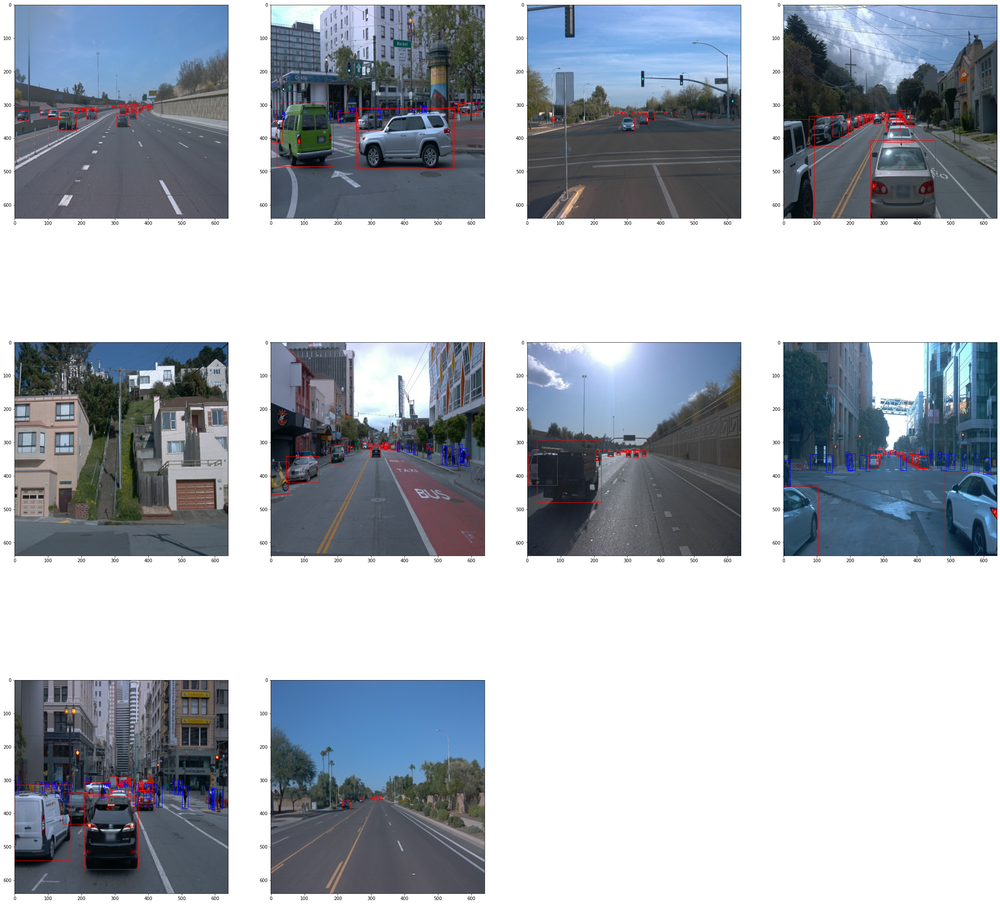

In [14]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    
    Description: This function takes a batch of images in the dataset and displays the image
    and its bounding boxes with color coding for each bounding box's class.
    
    Params: batch - tf.data.Dataset - batch of data entries.
    Returns: None
    
    """
    # ADD CODE HERE
    n = 0
    for i in batch:
        n += 1
    
    cols = 4
    rows = math.ceil(n / cols)
    print("Displaying {} Image samples".format(n))
    #print("cols: ", cols, " rows: ", rows)
    
    fig = plt.figure(figsize=(40,40))
    #fig, axs = plt.subplots(2,5, figsize=(40,40))

    for i, data in enumerate(batch):
        img = data['image']
        
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img.numpy().astype("uint8"))
        
        
        #1 car, 2: pedestrian, 4: cyclist
        color_map = { 1: 'red', 2:'blue', 4:'green'}
        #print(data['groundtruth_classes'].numpy())
        for bbox, cl in zip(data['groundtruth_boxes'], data['groundtruth_classes'].numpy()):
            #y1, x1, y2, x2
            #this means x1 is bottom left corner!
            x = bbox[1] * img.shape[1]
            y = bbox[0] * img.shape[0]
            width = bbox[3] * img.shape[1] - x
            height = bbox[2] * img.shape[0] - y
            rec = patches.Rectangle((x,y), width, height, linewidth=1, edgecolor=color_map[cl], facecolor='none')
            ax.add_patch(rec)
            
dataset.take(10)
display_instances(dataset.take(10))

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

Displaying 10 Image samples


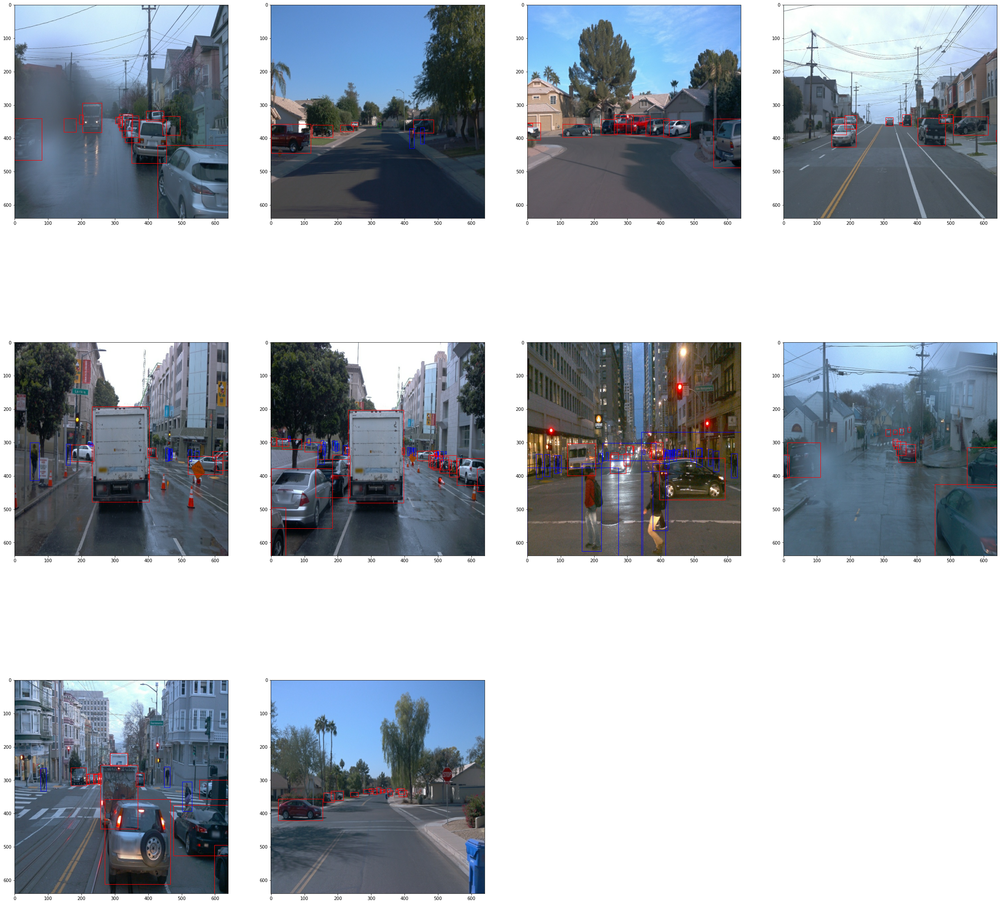

In [15]:
## STUDENT SOLUTION HERE

display_instances(dataset.take(10))
 


## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

defaultdict(<class 'int'>, {0: 0, 1: 1678, 2: 435, 3: 0, 4: 10})
['cars', 'pedestrians', 'cyclists']
[1678, 435, 10]


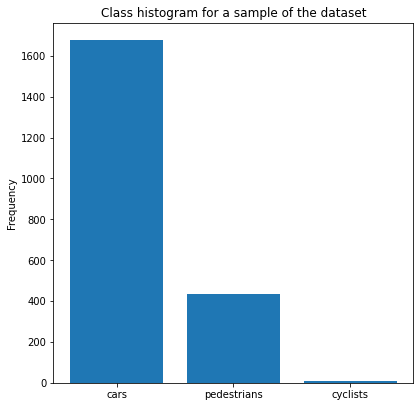

In [16]:
# I can look into the class distributions to see how many objects of 
# each class there are

def create_histogram(batch):
    """
    Description: Takes a batch of data entries of the dataset and calculates the frequency of each 
    object class in the batch. Then it displays an histogram with the class frequencies.
    
    Params: batch - tf.data.Dataset - batch of data entries.
    Returns: None
    """
    class_dic = collections.defaultdict(int)
    #print(class_dic)

    for i, data in enumerate(batch):

        classes = data['groundtruth_classes'].numpy()
        #print(classes)
        class_counts = np.bincount(classes)
        for j, class_count in enumerate(class_counts):
            #entonces cuando yo modifico si se agrega, cuando leo no se agrega y te regresa default value
            class_dic[j] += class_count

        #All images are 640 x 640 x 3
        #print(data['image'].shape)

    print(class_dic)

    class_map = {"cars": class_dic[1], "pedestrians": class_dic[2], "cyclists": class_dic[4]}
    keys = list(class_map.keys())
    values = list(class_map.values())

    print(keys)
    print(values)

    fig = plt.figure(figsize=(5,5))
    ax = fig.add_axes([0,0,1,1])
    ax.bar(keys, values)
    ax.set_title("Class histogram for a sample of the dataset")
    ax.set_ylabel("Frequency")
    
create_histogram(dataset.take(100))